## PTC

Originally written by Alex Broughton



In [1]:
! eups list -s | grep lsst_distrib

lsst_distrib          g4213664e8e+da93b84f60 	current w_2023_37 setup


In [2]:
import os
import numpy as np
import glob
from astropy.io import fits
import pickle as pkl
import matplotlib.pyplot as plt
from lsst.daf.butler import Butler
import lsst.afw.display as afwDisplay
import lsst.afw.image as afwImage
from astropy.table import Table, vstack, join
from scipy import stats
from scipy.optimize import curve_fit
from lsst.obs.lsst import LsstCam
camera = LsstCam().getCamera()
from matplotlib.pyplot import cm
import lsst.cp.pipe as cpPipe
import itertools
from lsst.cp.pipe.makeBrighterFatterKernel import BrighterFatterKernelSolveTask


plt.rcParams.update({'font.size': 15})

slacAmps = {'C10':'AMP01','C11':'AMP02','C12':'AMP03','C13':'AMP04',\
           'C14':'AMP05','C15':'AMP06','C16':'AMP07','C17':'AMP08',\
           'C07':'AMP09','C06':'AMP10','C05':'AMP11','C04':'AMP12',\
           'C03':'AMP13','C02':'AMP14','C01':'AMP15','C00':'AMP16'}

In [3]:
#repo_path = "/sdf/group/lsst/camera/IandT/repo_gen3/BOT_data/butler.yaml"

repo_path = "/sdf/group/rubin/repo/main/"
butler = Butler(repo_path)
registry = butler.registry


# Example
_________

In [8]:
detector=23
collections= 'u/abrought/BF/2023.01.26/ptc.2023.01.26'


datasetRefs = list(registry.queryDatasets(datasetType="cpPtcExtract", collections=collections))
raw=butler.get('raw', dataId=datasetRefs[0].dataId,collections=collections)
camera=butler.get('camera', dataId=datasetRefs[0].dataId,collections=collections)

defaultConfigSolve = cpPipe.ptc.PhotonTransferCurveSolveTask.ConfigClass()
defaultTaskSolve = cpPipe.ptc.PhotonTransferCurveSolveTask(config=defaultConfigSolve)
solveConfig = defaultConfigSolve
solveConfig.ptcFitType = 'FULLCOVARIANCE'
solveTask = cpPipe.ptc.PhotonTransferCurveSolveTask(config=solveConfig)
bfktask = BrighterFatterKernelSolveTask()


ptc=butler.get('ptc', detector=detector, instrument='LSSTCam', collections=collections)
extractedptc=[ butler.get('cpPtcExtract', dataId=adatasetRef.dataId, detector=detector, collections=collections) for adatasetRef in datasetRefs ] 

solve=solveTask.run(extractedptc, camera=camera,detId=detector)


ERROR:timer.lsst.daf.butler.datastores.fileDatastore:Reading from location file:///sdf/group/rubin/repo/main/u/abrought/BF/2023.01.26/ptc.2023.01.26/20230127T011102Z/cpPtcExtract/20211207/MC_C_20211207_000141/cpPtcExtract_LSSTCam_SDSSi~ND_OD0_5_MC_C_20211207_000141_R03_S12_u_abrought_BF_2023_01_26_ptc_2023_01_26_20230127T011102Z.fits  with formatter lsst.obs.base.formatters.fitsGeneric.FitsGenericFormatter: Took 0.0145 seconds


KeyboardInterrupt: 

# Setups
________

In [4]:
def pretty(config):
    for i in config.toDict():
        print("\b{}\t{}".format(i,config.toDict()[i]))
    print("\n")
    return
            

def avg_kernels(d, exclude_channels=[]):
    t = np.zeros(d["C00"].shape)
    for k,channel in zip(d.values(), d.keys()):
        if channel in exclude_channels:
            continue
        t += k
    return t / len(d.values())

def avg_dict(d, exclude_channels=[]):

        t = np.zeros((8,8))
        for k,channel in zip(d.values(), d.keys()):
            if channel in exclude_channels:
                continue
            t += k
        return t / len(d.values())
    
def tileArray(in_array):
        """Given an input quarter-image, tile/mirror it and return full image.
        Given a square input of side-length n, of the form
        input = array([[1, 2, 3],
                       [4, 5, 6],
                       [7, 8, 9]])
        return an array of size 2n-1 as
        output = array([[ 9,  8,  7,  8,  9],
                        [ 6,  5,  4,  5,  6],
                        [ 3,  2,  1,  2,  3],
                        [ 6,  5,  4,  5,  6],
                        [ 9,  8,  7,  8,  9]])
        Parameters
        ----------
        input : `np.array`, (N, N)
            The square input quarter-array
        Returns
        -------
        output : `np.array`, (2*N + 1, 2*N + 1)
            The full, tiled array
        """
        assert(in_array.shape[0] == in_array.shape[1])
        length = in_array.shape[0] - 1
        output = np.zeros((2*length + 1, 2*length + 1))

        for i in range(length + 1):
            for j in range(length + 1):
                output[i + length, j + length] = in_array[i, j]
                output[-i + length, j + length] = in_array[i, j]
                output[i + length, -j + length] = in_array[i, j]
                output[-i + length, -j + length] = in_array[i, j]
        return output

In [7]:
# pick base collection and sensor
collections= 'u/abrought/BF/2023.01.26/ptc.2023.01.26'
detector=23
amp = 'C10'

# get the list of cpPtcExtract files
datasetRefs = list(registry.queryDatasets(datasetType="cpPtcExtract", collections=collections))

# get a raw image as a dummy file
raw=butler.get('raw', dataId=datasetRefs[0].dataId,collections=collections)

# get the camera object
camera=butler.get('camera', dataId=datasetRefs[0].dataId,collections=collections)

# setup the PTC solver configs
defaultConfigSolve = cpPipe.ptc.PhotonTransferCurveSolveTask.ConfigClass()
defaultTaskSolve = cpPipe.ptc.PhotonTransferCurveSolveTask(config=defaultConfigSolve)
solveConfig = defaultConfigSolve
solveConfig.ptcFitType = 'FULLCOVARIANCE'
solveTask = cpPipe.ptc.PhotonTransferCurveSolveTask(config=solveConfig)

# get the cpPtcExtract objects
ptc=butler.get('ptc', detector=detector, instrument='LSSTCam', collections=collections)
extracted_ptcs=[ butler.get('cpPtcExtract', dataId=adatasetRef.dataId, detector=detector, collections=collections) for adatasetRef in datasetRefs ] 


ERROR:timer.lsst.daf.butler.datastores.fileDatastore:Reading from location file:///sdf/group/rubin/repo/main/u/abrought/BF/2023.01.26/ptc.2023.01.26/20230127T011102Z/cpPtcExtract/20211207/MC_C_20211207_000339/cpPtcExtract_LSSTCam_SDSSi_MC_C_20211207_000339_R03_S12_u_abrought_BF_2023_01_26_ptc_2023_01_26_20230127T011102Z.fits  with formatter lsst.obs.base.formatters.fitsGeneric.FitsGenericFormatter: Took 0.0164 seconds


KeyboardInterrupt: 

In [23]:
# ONLY NEED TO RUN ONCE
# Get a subset of exposure times

def GetSpacedElements(array, numElems):
    out = array[np.round(np.linspace(0, len(array)-1, numElems)).astype(int)]
    return out

exps = GetSpacedElements(np.unique(ptc.rawExpTimes['C00']), numElems=15)

detector=23
collections= 'u/abrought/BF/2023.01.26/ptc.2023.01.26'

datasetRefs = list(registry.queryDatasets(datasetType="cpPtcExtract", collections=collections))
exptimes = ()
subsetExposures = []
for ref in datasetRefs:
    raw=butler.get('raw', dataId=ref.dataId,collections=collections)
    if raw.visitInfo.exposureTime in exps:
        subsetExposures.append(ref)

print(subsetExposures)

[DatasetRef(DatasetType('cpPtcExtract', {band, instrument, detector, physical_filter, exposure}, PhotonTransferCurveDataset, isCalibration=True), {instrument: 'LSSTCam', detector: 23, exposure: 3021120600666, ...}, id=8a997e32-57ca-4c7f-808f-945ec7fc9547, run='u/abrought/BF/2023.01.26/ptc.2023.01.26/20230127T011102Z'), DatasetRef(DatasetType('cpPtcExtract', {band, instrument, detector, physical_filter, exposure}, PhotonTransferCurveDataset, isCalibration=True), {instrument: 'LSSTCam', detector: 23, exposure: 3021120600667, ...}, id=9ba0feb9-ab2f-41dd-863a-bcbe3b2f64ed, run='u/abrought/BF/2023.01.26/ptc.2023.01.26/20230127T011102Z'), DatasetRef(DatasetType('cpPtcExtract', {band, instrument, detector, physical_filter, exposure}, PhotonTransferCurveDataset, isCalibration=True), {instrument: 'LSSTCam', detector: 23, exposure: 3021120600681, ...}, id=20e9591d-1dbf-4629-8f13-69ce437494f4, run='u/abrought/BF/2023.01.26/ptc.2023.01.26/20230127T011102Z'), DatasetRef(DatasetType('cpPtcExtract', 

In [25]:
# Get only one at each exposure time
subsetExposures = subsetExposures[:30][::2]


# 1. Extracting 0 < T < 7.7e4 (PTC Turnoff)
_________________________________

In [6]:
# trim the cpPtcExtract object to only those with mean fluxes within some boundaries
min_signal = 0      # adu
max_signal = 7.7e4  # adu

# create mask
# cpPtcExtract contains a PTC dataset object for the covariance of the difference image between the flat pairs (i), 
# and a corresponding dummy PTC dataset that is empty (i+1), but both are needed for the PTC solver
mask = np.zeros(len(extracted_ptcs), dtype=bool)
for i, extracted_ptc in enumerate(extracted_ptcs):
    #print(f"{(i+1)}/{len(extracted_ptcs)}")
    if np.isnan(extracted_ptc.rawMeans['C00'][0]):
        pass
    elif extracted_ptc.rawMeans['C00'][0] <= max_signal:
        mask[i] = True
        mask[i+1] = True

# show length of mask
print(f"N       {len(mask)}\nN[mask] {mask.sum()}")

N       1374
N[mask] 1292


In [7]:
# run the PTC solver
print("Running PTC Solver...", end="")
solve=solveTask.run(np.asarray(extracted_ptcs)[mask], camera=camera, detId=detector)
print(" Done.")

Running PTC Solver... Done.


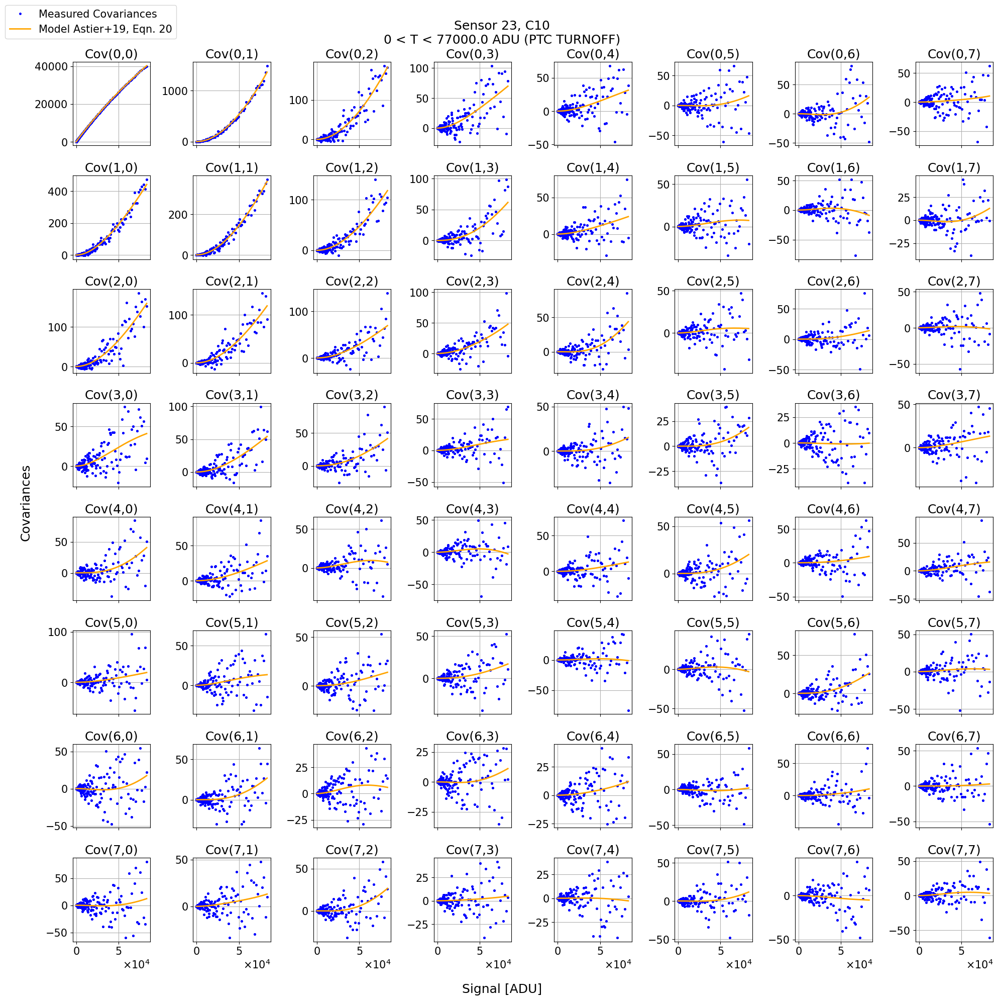

In [8]:
amp = 'C10'
fig,axs=plt.subplots(8,8,figsize=(20,20),sharex=True,)
ptc_1=solve.outputPtcDataset
for (i,j) in itertools.product( range(8), range(8) ):
    ax=axs[i][j]   
    
    c=ax.plot(np.array(ptc_1.rawMeans[amp])[ptc_1.expIdMask[amp]],
              np.array(ptc_1.covariances[amp])[:,i,j][ptc_1.expIdMask[amp]], 
              "o", markersize=2.5, color="blue",label='Measured Covariances')  
    
    c=ax.plot(np.array(ptc_1.rawMeans[amp])[ptc_1.expIdMask[amp]],
              np.array(ptc_1.covariancesModel[amp])[:,i,j][ptc_1.expIdMask[amp]], 
              "-", linewidth=2, color="orange",label='Model Astier+19, Eqn. 20') 

    ax.set_title(f"Cov({i},{j})")
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax.grid()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=2)
fig.supylabel("Covariances")
fig.supxlabel("Signal [ADU]")

fig.suptitle(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
fig.tight_layout()

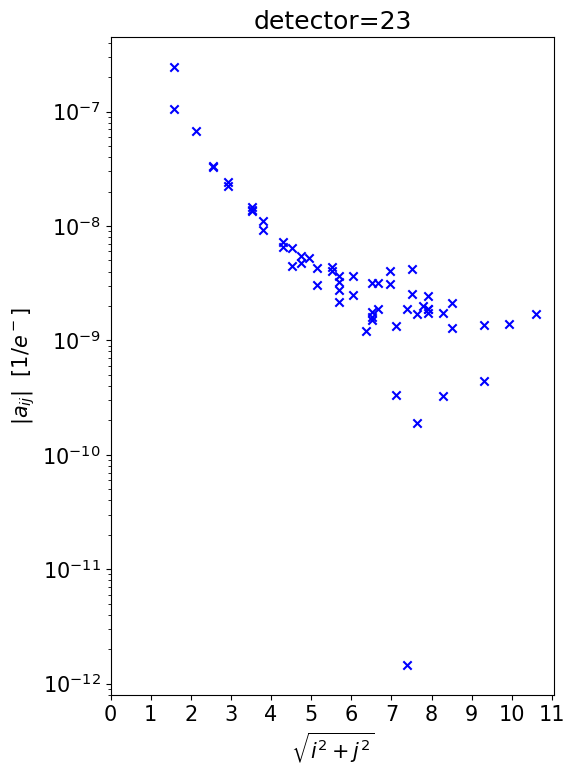

In [9]:
rs = []
a_ij = []
for i in range(8):
    for j in range(8):
        if i==0 and j==0:
            continue
        r = np.sqrt((i+0.5)**2 + (j+0.5)**2)
        rs.append(r)

        avg = avg_dict(ptc.aMatrix)
        a_ij.append(avg[i][j])

plt.figure(figsize=(6,8))
plt.scatter(rs, a_ij, marker="x", color="blue")
#plt.ylim(-1e-7,3e-7)
plt.yscale("log")
plt.ylabel(r"$|a_{ij}|$  [1/$e^-$]")
plt.xlabel(r"$\sqrt{i^2 + j^2}$")
plt.xticks(range(12))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0), useMathText=True)
plt.title(f"detector={detector}")
plt.tight_layout()

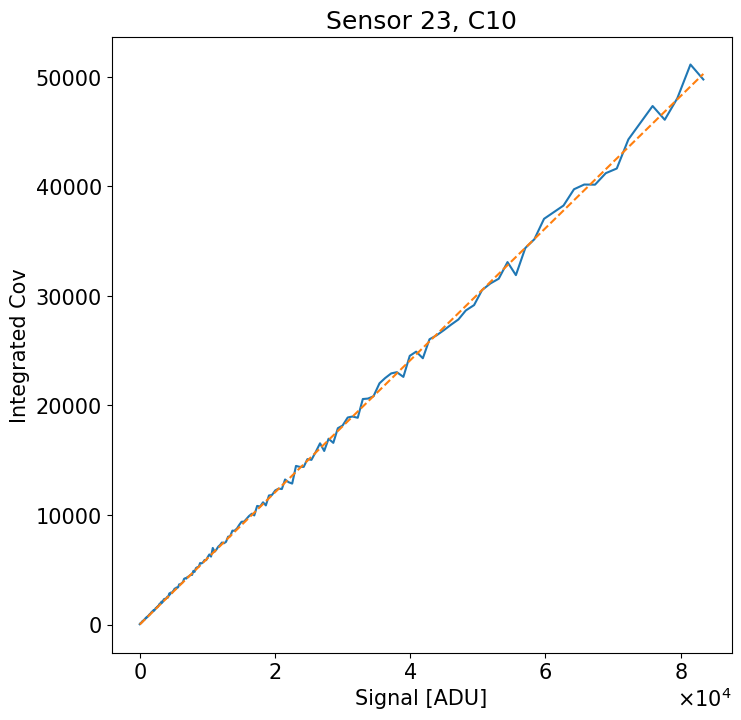

In [10]:
# Plot the integrated covariances
integrated_cov = []
for matrix in np.asarray(ptc.covariances[amp]):
    integrated_cov.append(np.sum(tileArray(matrix)))
    
plt.figure(figsize=(8,8))
plt.plot(ptc.finalMeans[amp], integrated_cov)
plt.plot(np.linspace(min(ptc.finalMeans[amp]),max(ptc.finalMeans[amp]),100), 1./ptc.gain[amp] * np.linspace(min(ptc.finalMeans[amp]),max(ptc.finalMeans[amp]),100), linestyle="--")
plt.xlabel("Signal [ADU]")
plt.ylabel("Integrated Cov")
plt.title(f"Sensor {detector}, {amp}")
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    


# 2. Extracting 1.0e4 < T < 7.7e4 (PTC TURNOFF)
______________________

In [10]:
# trim the cpPtcExtract object to only those with mean fluxes within some boundaries
min_signal = 1.0e4  # adu
max_signal = 7.7e4  # adu

# create mask
# cpPtcExtract contains a PTC dataset object for the covariance of the difference image between the flat pairs (i), 
# and a corresponding dummy PTC dataset that is empty (i+1), but both are needed for the PTC solver
mask = np.zeros(len(extracted_ptcs), dtype=bool)
for i, extracted_ptc in enumerate(extracted_ptcs):
    #print(f"{(i+1)}/{len(extracted_ptcs)}")
    if np.isnan(extracted_ptc.rawMeans['C00'][0]):
        pass
    elif (extracted_ptc.rawMeans['C00'][0] <= max_signal and 
          extracted_ptc.rawMeans['C00'][0] >= min_signal):
        mask[i] = True
        mask[i+1] = True

# show length of mask
print(f"N       {len(mask)}\nN[mask] {mask.sum()}")

N       1374
N[mask] 344


In [11]:
# run the PTC solver
print("Running PTC Solver...", end="")
solve=solveTask.run(np.asarray(extracted_ptcs)[mask], camera=camera, detId=detector)
print(" Done.")

Running PTC Solver... Done.


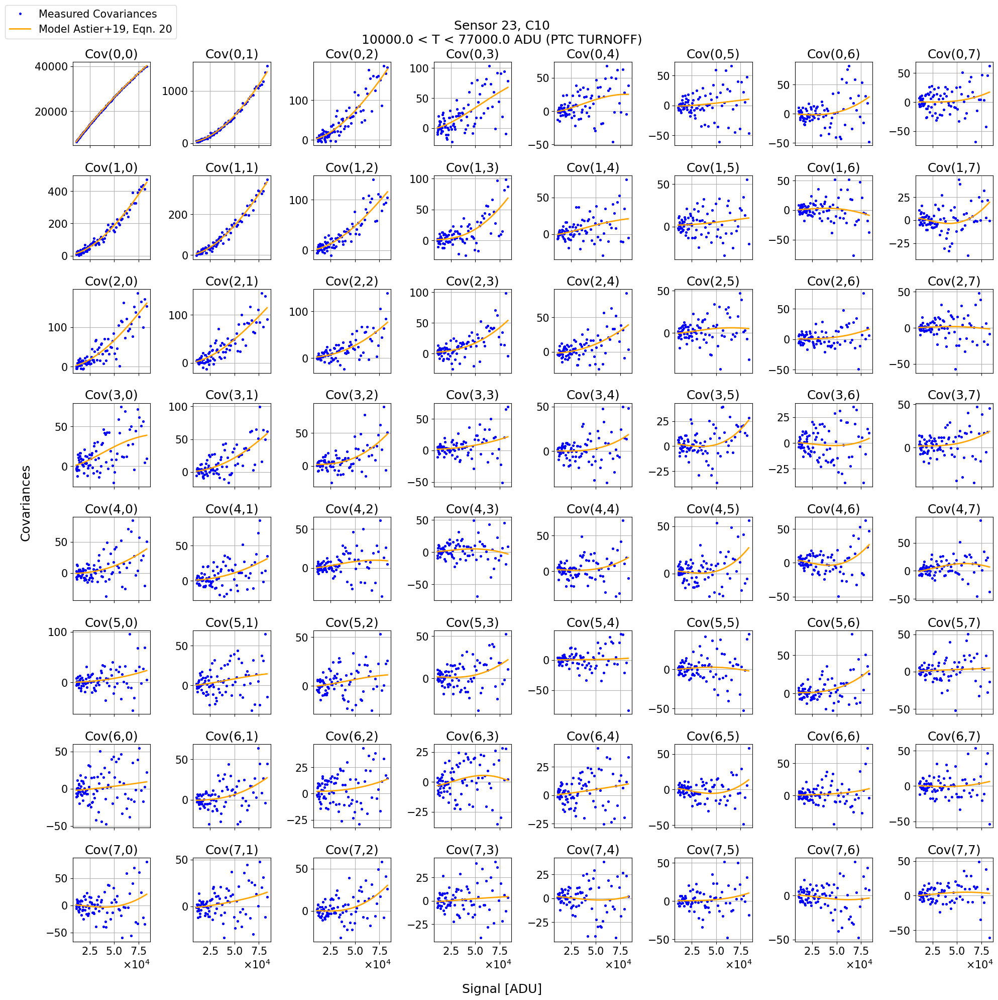

In [12]:
fig,axs=plt.subplots(8,8,figsize=(20,20),sharex=True,)
ptc_2=solve.outputPtcDataset
for (i,j) in itertools.product( range(8), range(8) ):
    ax=axs[i][j]   
    
    c=ax.plot(np.array(ptc_2.rawMeans[amp])[ptc_2.expIdMask[amp]],
              np.array(ptc_2.covariances[amp])[:,i,j][ptc_2.expIdMask[amp]], 
              "o", markersize=2.5, color="blue",label='Measured Covariances')  
    
    c=ax.plot(np.array(ptc_2.rawMeans[amp])[ptc_2.expIdMask[amp]],
              np.array(ptc_2.covariancesModel[amp])[:,i,j][ptc_2.expIdMask[amp]], 
              "-", linewidth=2, color="orange",label='Model Astier+19, Eqn. 20') 

    ax.set_title(f"Cov({i},{j})")
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax.grid()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=2)
fig.supylabel("Covariances")
fig.supxlabel("Signal [ADU]")

fig.suptitle(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
fig.tight_layout()

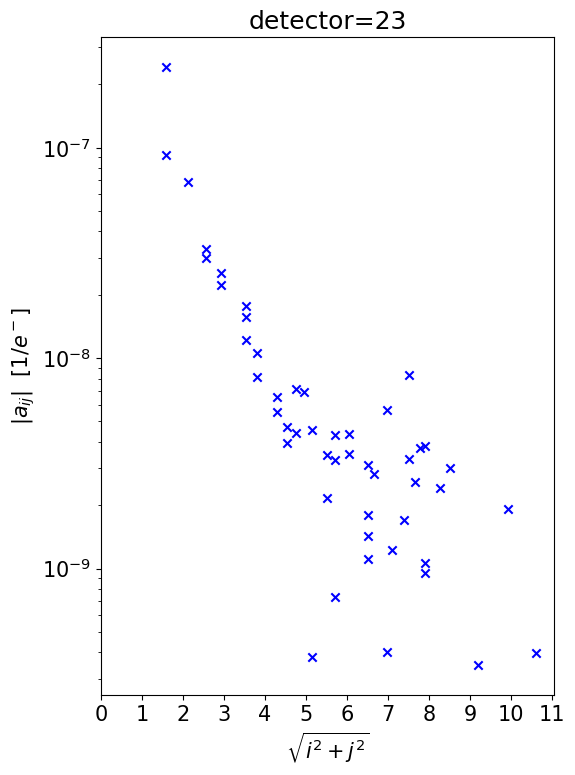

In [13]:
rs = []
a_ij = []
for i in range(8):
    for j in range(8):
        if i==0 and j==0:
            continue
        r = np.sqrt((i+0.5)**2 + (j+0.5)**2)
        rs.append(r)

        avg = avg_dict(ptc_2.aMatrix)
        a_ij.append(avg[i][j])

plt.figure(figsize=(6,8))
plt.scatter(rs, a_ij, marker="x", color="blue")
#plt.ylim(-1e-7,3e-7)
plt.yscale("log")
plt.ylabel(r"$|a_{ij}|$  [1/$e^-$]")
plt.xlabel(r"$\sqrt{i^2 + j^2}$")
plt.xticks(range(12))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0), useMathText=True)
plt.title(f"detector={detector}")
plt.tight_layout()

# 3. Extracting 0 < T < 5.8e4 (pCTI TURNOFF)
_________________________________

In [14]:
# trim the cpPtcExtract object to only those with mean fluxes within some boundaries
min_signal = 0.0  # adu
max_signal = 5.8e4  # adu

# create mask
# cpPtcExtract contains a PTC dataset object for the covariance of the difference image between the flat pairs (i), 
# and a corresponding dummy PTC dataset that is empty (i+1), but both are needed for the PTC solver
mask = np.zeros(len(extracted_ptcs), dtype=bool)
for i, extracted_ptc in enumerate(extracted_ptcs):
    #print(f"{(i+1)}/{len(extracted_ptcs)}")
    if np.isnan(extracted_ptc.rawMeans['C00'][0]):
        pass
    elif (extracted_ptc.rawMeans['C00'][0] <= max_signal and 
          extracted_ptc.rawMeans['C00'][0] >= min_signal):
        mask[i] = True
        mask[i+1] = True

# show length of mask
print(f"N       {len(mask)}\nN[mask] {mask.sum()}")

N       1374
N[mask] 1244


In [15]:
# run the PTC solver
print("Running PTC Solver...", end="")
solve=solveTask.run(np.asarray(extracted_ptcs)[mask], camera=camera, detId=detector)
print(" Done.")

Running PTC Solver... Done.


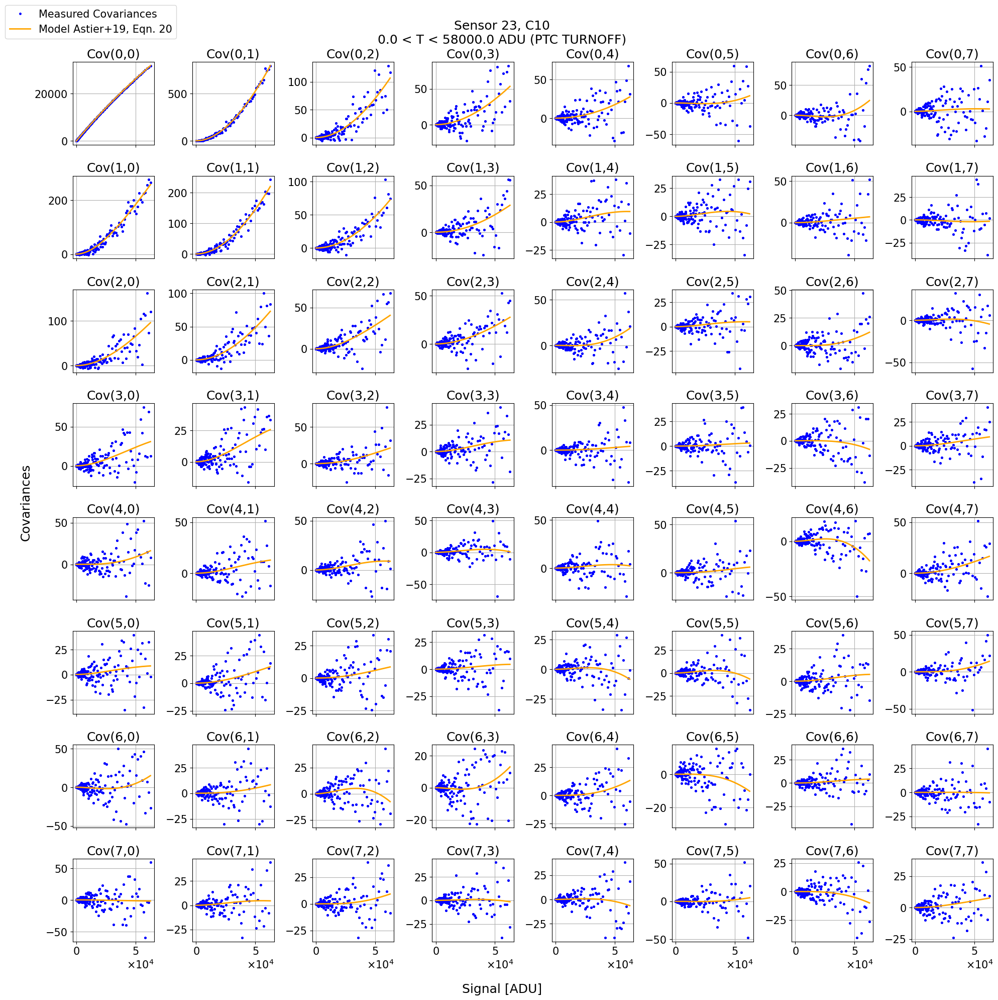

In [16]:
fig,axs=plt.subplots(8,8,figsize=(20,20),sharex=True,)
ptc_3=solve.outputPtcDataset
for (i,j) in itertools.product( range(8), range(8) ):
    ax=axs[i][j]   
    
    c=ax.plot(np.array(ptc_3.rawMeans[amp])[ptc_3.expIdMask[amp]],
              np.array(ptc_3.covariances[amp])[:,i,j][ptc_3.expIdMask[amp]], 
              "o", markersize=2.5, color="blue",label='Measured Covariances')  
    
    c=ax.plot(np.array(ptc_3.rawMeans[amp])[ptc_3.expIdMask[amp]],
              np.array(ptc_3.covariancesModel[amp])[:,i,j][ptc_3.expIdMask[amp]], 
              "-", linewidth=2, color="orange",label='Model Astier+19, Eqn. 20') 

    ax.set_title(f"Cov({i},{j})")
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax.grid()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=2)
fig.supylabel("Covariances")
fig.supxlabel("Signal [ADU]")

fig.suptitle(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
fig.tight_layout()

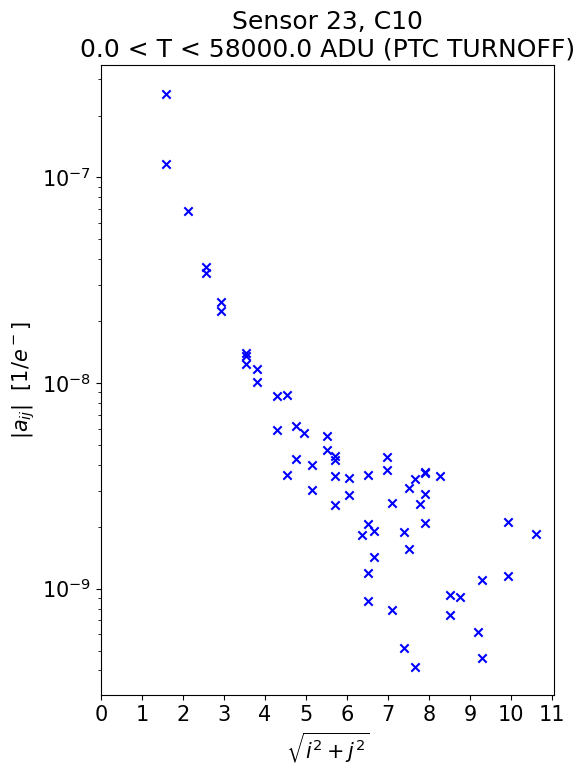

In [17]:
rs = []
a_ij = []
for i in range(8):
    for j in range(8):
        if i==0 and j==0:
            continue
        r = np.sqrt((i+0.5)**2 + (j+0.5)**2)
        rs.append(r)

        avg = avg_dict(ptc_3.aMatrix)
        a_ij.append(avg[i][j])

plt.figure(figsize=(6,8))
plt.scatter(rs, a_ij, marker="x", color="blue")
#plt.ylim(-1e-7,3e-7)
plt.yscale("log")
plt.ylabel(r"$|a_{ij}|$  [1/$e^-$]")
plt.xlabel(r"$\sqrt{i^2 + j^2}$")
plt.xticks(range(12))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0), useMathText=True)
plt.title(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
plt.tight_layout()

# 4. Extracting 1.0e4 < T < 5.8e4 adu (pCTI TURNOFF)

In [18]:
# trim the cpPtcExtract object to only those with mean fluxes within some boundaries
min_signal = 1.0e4  # adu
max_signal = 5.8e4  # adu

# create mask
# cpPtcExtract contains a PTC dataset object for the covariance of the difference image between the flat pairs (i), 
# and a corresponding dummy PTC dataset that is empty (i+1), but both are needed for the PTC solver
mask = np.zeros(len(extracted_ptcs), dtype=bool)
for i, extracted_ptc in enumerate(extracted_ptcs):
    #print(f"{(i+1)}/{len(extracted_ptcs)}")
    if np.isnan(extracted_ptc.rawMeans['C00'][0]):
        pass
    elif (extracted_ptc.rawMeans['C00'][0] <= max_signal and 
          extracted_ptc.rawMeans['C00'][0] >= min_signal):
        mask[i] = True
        mask[i+1] = True

# show length of mask
print(f"N       {len(mask)}\nN[mask] {mask.sum()}")

N       1374
N[mask] 296


In [19]:
# run the PTC solver
print("Running PTC Solver...", end="")
solve=solveTask.run(np.asarray(extracted_ptcs)[mask], camera=camera, detId=detector)
print(" Done.")

Running PTC Solver... Done.


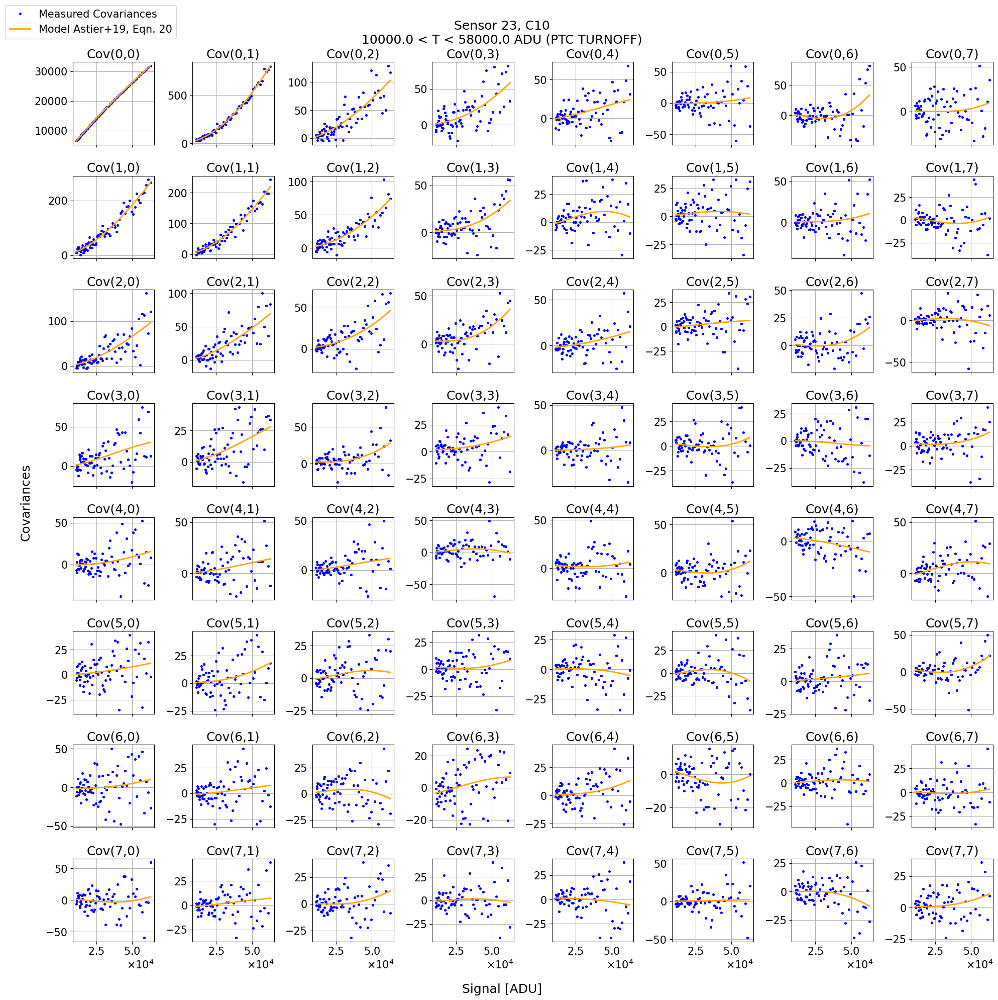

In [20]:
fig,axs=plt.subplots(8,8,figsize=(20,20),sharex=True,)
ptc_4=solve.outputPtcDataset
for (i,j) in itertools.product( range(8), range(8) ):
    ax=axs[i][j]   
    
    c=ax.plot(np.array(ptc_4.rawMeans[amp])[ptc_4.expIdMask[amp]],
              np.array(ptc_4.covariances[amp])[:,i,j][ptc_4.expIdMask[amp]], 
              "o", markersize=2.5, color="blue",label='Measured Covariances')  
    
    c=ax.plot(np.array(ptc_4.rawMeans[amp])[ptc_4.expIdMask[amp]],
              np.array(ptc_4.covariancesModel[amp])[:,i,j][ptc_4.expIdMask[amp]], 
              "-", linewidth=2, color="orange",label='Model Astier+19, Eqn. 20') 

    ax.set_title(f"Cov({i},{j})")
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax.grid()

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=2)
fig.supylabel("Covariances")
fig.supxlabel("Signal [ADU]")

fig.suptitle(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
fig.tight_layout()

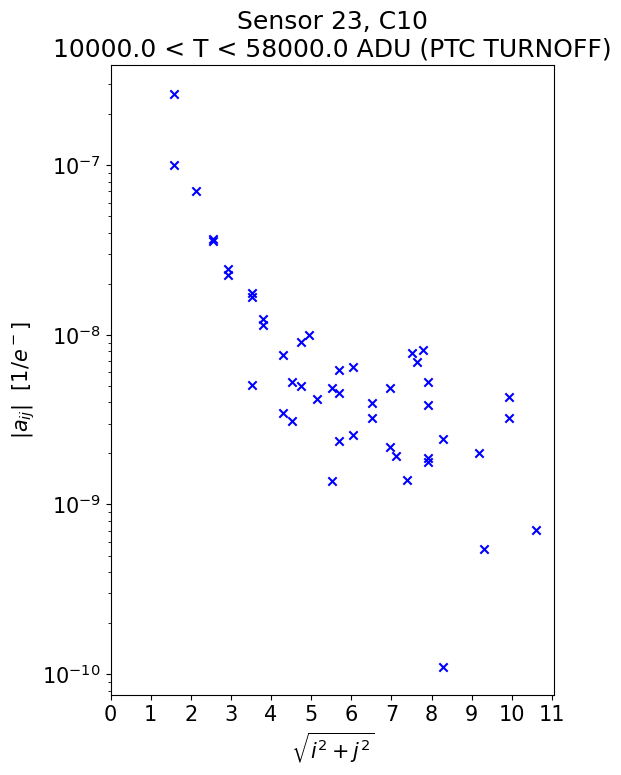

In [21]:
def avg_dict(d, exclude_channels=[]):

        t = np.zeros((8,8))
        for k,channel in zip(d.values(), d.keys()):
            if channel in exclude_channels:
                continue
            t += k
        return t / len(d.values())

rs = []
a_ij = []
for i in range(8):
    for j in range(8):
        if i==0 and j==0:
            continue
        r = np.sqrt((i+0.5)**2 + (j+0.5)**2)
        rs.append(r)

        avg = avg_dict(ptc_4.aMatrix)
        a_ij.append(avg[i][j])

plt.figure(figsize=(6,8))
plt.scatter(rs, a_ij, marker="x", color="blue")
#plt.ylim(-1e-7,3e-7)
plt.yscale("log")
plt.ylabel(r"$|a_{ij}|$  [1/$e^-$]")
plt.xlabel(r"$\sqrt{i^2 + j^2}$")
plt.xticks(range(12))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0), useMathText=True)
plt.title(f"Sensor {detector}, {amp}\n{min_signal} < T < {max_signal} ADU (PTC TURNOFF)")
plt.tight_layout()

# 4. Generating Kernels from each best fit

In [4]:
butler = Butler("/repo/main")
ptc_1 = butler.get('ptc', detector=23, instrument='LSSTCam', collections='u/abrought/BF/2023.04.28/ptc.2023.04.28.R03-S12.trunc_to_pcti')
datasetRefs = list(registry.queryDatasets(datasetType="cpPtcExtract", collections='u/abrought/BF/2023.04.28/ptc.2023.04.28.R03-S12.trunc_to_pcti'))
raw=butler.get('raw', dataId=datasetRefs[0].dataId,collections='u/abrought/BF/2023.04.28/ptc.2023.04.28.R03-S12.trunc_to_pcti')

## 4.1 Normal configurations

Configuration Testing

In [5]:
print("Generating Kernels")
config = cpPipe.BrighterFatterKernelSolveConfig()
# Flag to enable/disable metadata saving for a task, enabled by default.
config.saveMetadata=True

# Flag to enable/disable saving of log output for a task, enabled by default.
config.saveLogOutput=True

# The level at which to calculate the brighter-fatter kernels
config.level='AMP'

# List of amp names to ignore when averaging the amplifier kernels into the detector kernel. Only relevant for level = DETECTOR
config.ignoreAmpsForAveraging=[]

# Rejection level for the sum of the input cross-correlations. Arrays which sum to greater than this are discarded before the clipped mean is calculated.
config.xcorrCheckRejectLevel=2.0

# Number of sigma to clip when calculating means for the cross-correlation
config.nSigmaClip=5.0

# Force the correlation matrix to have zero sum by adjusting the (0,0) value?
config.forceZeroSum=True

# Use the PTC 'a' matrix (Astier et al. 2019 equation 20) instead of the average of measured covariances?
config.useAmatrix=True

# The maximum number of iterations allowed for the successive over-relaxation method
config.maxIterSuccessiveOverRelaxation=10000

# The target residual error for the successive over-relaxation method
config.eLevelSuccessiveOverRelaxation=5e-14

# Use a quadratic fit to find the correlations instead of simple averaging?
config.correlationQuadraticFit=False

# Build a model of the correlation coefficients for radii larger than this value in pixels?
config.correlationModelRadius=4

# Slope of the correlation model for radii larger than correlationModelRadius
config.correlationModelSlope=-1.55

# Signal level in ADU where to sample the covariance model.
config.covSample=0.0

# Factor used to scale the A matrix.
config.scaleFactor=0.65

# name for connection dummy
config.connections.dummy='raw'

# name for connection camera
config.connections.camera='camera'

# name for connection inputPtc
config.connections.inputPtc='ptc'

# name for connection outputBFK
config.connections.outputBFK='bfk'

bfktask = BrighterFatterKernelSolveTask(config=config)

Generating Kernels


Nominal config

In [8]:
print("Generating Kernels")
config = cpPipe.BrighterFatterKernelSolveConfig()
bfktask = BrighterFatterKernelSolveTask(config=config)

Generating Kernels


Default Configs

In [12]:
print("Generating Kernels")
config = cpPipe.BrighterFatterKernelSolveConfig()
config.forceZeroSum = True
config.correlationModelRadius=3
config.useAmatrix=True
config.correlationQuadraticFit = False
config.level='AMP'
bfktask = BrighterFatterKernelSolveTask(config=config)

Generating Kernels


In [9]:
#         0 < T < 7.7e4
result_1 = bfktask.run(inputPtc=ptc_1,dummy=[raw],camera=camera,inputDims={'detector': 23})

#print("Generating Kernels")
#config = cpPipe.BrighterFatterKernelSolveConfig()
#config.forceZeroSum = False
#config.useAmatrix=True
#config.correlationQuadraticFit = False
#config.level='AMP'
#bfktask = BrighterFatterKernelSolveTask(config=config)

#     1.0e4 < T < 7.7e4
#result_2 = bfktask.run(inputPtc=ptc_1,dummy=[raw],camera=camera,inputDims={'detector': detector})
                     
#         0 < T < 5.8e4
#result_3 = bfktask.run(inputPtc=ptc_3,dummy=[raw],camera=camera,inputDims={'detector': detector})
                     
#     1.0e4 < T < 7.7e4
#result_4 = bfktask.run(inputPtc=ptc_4,dummy=[raw],camera=camera,inputDims={'detector': detector})

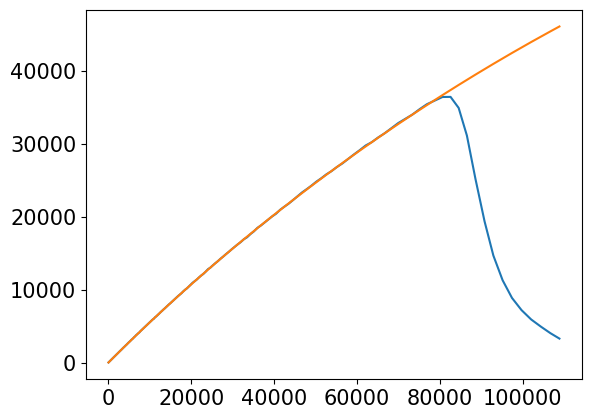

In [21]:
plt.plot(ptc_1.rawMeans['C00'], ptc_1.rawVars['C00'])
plt.plot(ptc_1.rawMeans['C00'], ptc_1.covariancesModel['C00'][:,0,0])

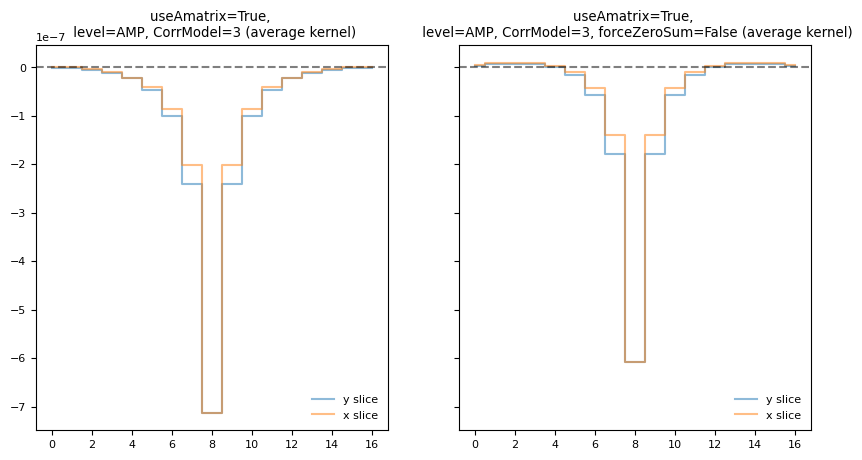

In [51]:
plt.rcParams.update({'font.size': 8})

titles = ['0 < T < 7.7e4',
          '1.0e4 < T < 7.7e4',
          '0 < T < 5.8e4',
          '1.0e4 < T < 7.7e4']
titles = ['useAmatrix=True, \n level=AMP, CorrModel=3 (average kernel)',
          'useAmatrix=True, \n level=AMP, CorrModel=3, forceZeroSum=False (average kernel)',
          '0 < T < 5.8e4',
          '1.0e4 < T < 7.7e4']
    
fig, axs = plt.subplots(1,2, figsize=(10,5), sharey=True, facecolor='w')
for i, bfk in enumerate([result_1 ,result_2]): #,result_3,result_4]):

    ax = axs.flatten()[i]
    mu = avg_kernels(bfk.outputBFK.ampKernels)
    ax.set_title(titles[i])
    ax.plot(-mu[:,8], drawstyle='steps-mid', alpha=0.5, label='y slice')
    ax.plot(-mu[8,:], drawstyle='steps-mid', alpha=0.5, label='x slice')
    ax.axhline(0.0,linestyle="--", color="black", alpha=0.5)
    
    ax.set_title(titles[i])

    ax.legend(loc=4, frameon=False)



## 4.1 With Quadratic Fit

In [42]:
print("Generating Kernels")
 # default configuration
config = cpPipe.BrighterFatterKernelSolveConfig()
config.forceZeroSum = True
config.correlationModelRadius=3
config.correlationQuadraticFit = True
bfktask = BrighterFatterKernelSolveTask(config=config)

Generating Kernels


In [43]:
#         0 < T < 7.7e4
result_1 = bfktask.run(inputPtc=ptc_1,dummy=[raw],camera=camera,inputDims={'detector': detector})

#     1.0e4 < T < 7.7e4
#result_2 = bfktask.run(inputPtc=ptc_2,dummy=[raw],camera=camera,inputDims={'detector': detector})
                     
#         0 < T < 5.8e4
#result_3 = bfktask.run(inputPtc=ptc_3,dummy=[raw],camera=camera,inputDims={'detector': detector})
                     
#     1.0e4 < T < 7.7e4
#result_4 = bfktask.run(inputPtc=ptc_3,dummy=[raw],camera=camera,inputDims={'detector': detector})

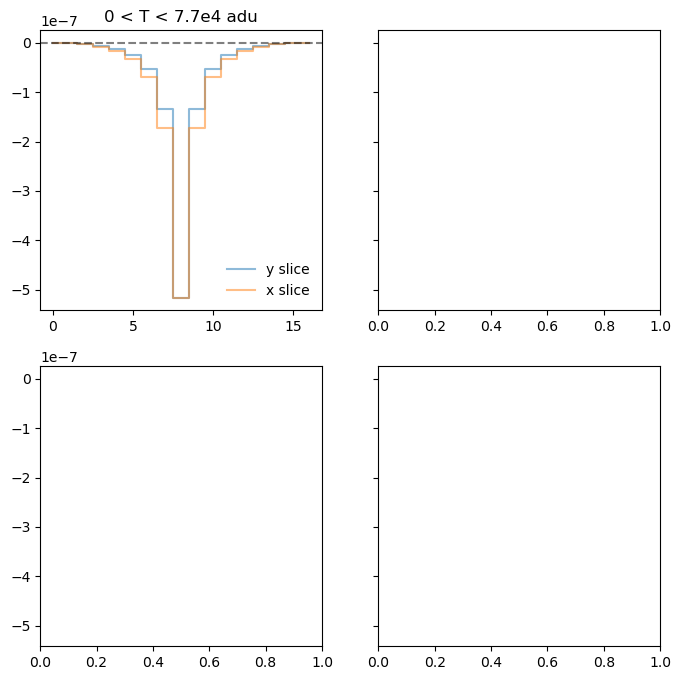

In [44]:
plt.rcParams.update({'font.size': 10})

titles = ['0 < T < 7.7e4',
          '1.0e4 < T < 7.7e4',
          '0 < T < 5.8e4',
          '1.0e4 < T < 5.8e4']
    
fig, axs = plt.subplots(2,2, figsize=(8,8), sharey=True, facecolor='w')
for i, bfk in enumerate([result_1]): #, result_2,result_3,result_4]):
    if i != 0:
        continue
    ax = axs.flatten()[i]
    mu = avg_kernels(bfk.outputBFK.ampKernels)
    ax.set_title(titles[i] + " adu")
    ax.plot(mu[:,8], drawstyle='steps-mid', alpha=0.5, label='y slice')
    ax.plot(mu[8,:], drawstyle='steps-mid', alpha=0.5, label='x slice')
    ax.axhline(0.0,linestyle="--", color="black", alpha=0.5)
    ax.legend(loc=4, frameon=False)


# 5. Correcting flat images

First, some memory cleaning:

In [45]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in list(
                          vars().items())), key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))


                   datasetRefs: 11.0 KiB
                extracted_ptcs: 11.0 KiB
                             _:  8.9 KiB
                           _45:  8.9 KiB
                            __:  8.3 KiB
                           _44:  8.3 KiB
                           ___:  8.1 KiB
                           _43:  8.1 KiB
                           _42:  7.8 KiB
                           _35:  7.7 KiB


In [1]:
from lsst.ip.isr.isrTask import IsrTask

config = IsrTask.ConfigClass()
config.doDark = False
config.doBias = True
config.doFlat = False
config.doDefect = False
config.doLinearize=True
config.doBrighterFatter=True
config.doApplyGains=False
config.brighterFatterApplyGain: False
isrtask = IsrTask(config=config) # default configuration
detector=23
# get a representative subset of raw images (one at each exptime)
print("Getting raw images from subsetExposures")
#subsetDatasetRefs = list(registry.queryDatasets(datasetType="raw", 
#                                                instrument="LSSTCam",
#                                                collections='u/abrought/BF/2023.01.26/ptc.2023.01.26', 
#                                                where="exposure IN (3021120600666, 3021120600681, 3021120600726, 3021120700164, 3021120700311, 3021120700368, 3021120700434, 3021120700470, 3021120700479, 3021120700482, 3021120700503, 3021120700536, 3021120700578, 3021120700599, 3021120700686)"))

raw_images = [butler.get('raw', detector=detector, dataId=ref.dataId, collections='LSSTCam/raw/all') for ref in subsetExposures]


# get the calibrations
print("Getting bias")
bias = butler.get('bias', detector=detector, instrument="LSSTCam", collections='u/cslage/bias_13144')
#print("Getting dark")
#dark = butler.get('dark', detector=detector, instrument="LSSTCam", collections=['u/cslage/dark_13144'])
#print("Getting defects")
#defects = butler.get('defect', detector=detector, dataId=datasetRef.dataId, collections=['u/cslage/defect_13144'])
print("Getting linearizer")
linearizer = butler.get('linearizer', detector=detector, instrument="LSSTCam", collections=['u/cslage/linearizer_28jan22/20220128T174703Z'])

# Pass it an averaged kernel
avg_kernel = avg_kernels(result_1.outputBFK.ampKernels, exclude_channels=[])

print("Running IsrTask...", end="")
isrRefs = []
for i in range(len(subsetExposures)):
    #print(f"{i+1}/{num_exposures_to_plot}")
    isrRefs.append( isrtask.run(raw_images[i], camera=camera, bias=bias, linearizer=linearizer,
                                dark=None, ptc=ptc, bfKernel=avg_kernel, defects=None,
                                detectorNum=detector) )
print("Done.")

Getting raw images from subsetExposures


NameError: name 'subsetExposures' is not defined

(-5000.0, 20000.0)

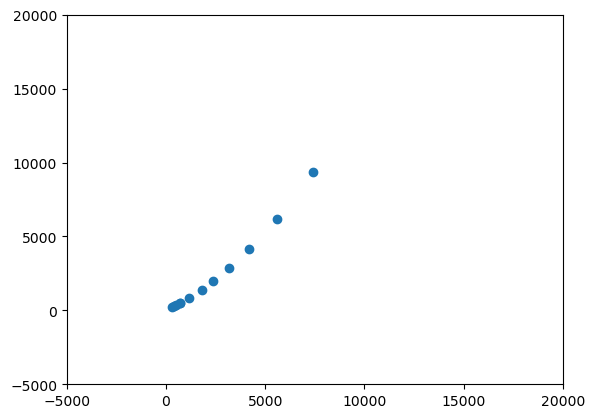

In [62]:
# Plot the reduced PTC
means = []
variances =[]

amp = 'C10'
for i, img in enumerate([struct.exposure for struct in isrRefs]):
    amp_obj           = camera[0].getAmplifiers()[0]
    # Clip 8 pix around the edges
    means.append(img.getImage().subset(amp_obj.getBBox().erodedBy(8)).getArray().mean())
    variances.append(img.getImage().subset(amp_obj.getBBox().erodedBy(8)).getArray().var())

plt.scatter(means, variances)
#plt.ylim(-5000,20000)
#plt.xlim(-5000,20000)
plt.plot(np.linspace(min(ptc_1.finalMeans[amp]),max(ptc.finalMeans[amp]),100), 1./ptc_1.gain[amp] * np.linspace(min(ptc_1.finalMeans[amp]),max(ptc_1.finalMeans[amp]),100), linestyle="--")
plt.loglog()
plt.ylabel("Variance")
plt.xlabel("Signal [adu]")



Now using the transposed kernel:

In [63]:
# Pass it an averaged kernel
avg_kernel = avg_kernels(result_1.outputBFK.ampKernels, exclude_channels=[])

print("Running IsrTask...", end="")
isrRefs = []
for i in range(len(subsetExposures)):
    #print(f"{i+1}/{num_exposures_to_plot}")
    isrRefs.append( isrtask.run(raw_images[i], camera=camera, bias=bias, linearizer=linearizer,
                                dark=None, ptc=ptc, bfKernel=avg_kernel.T, defects=None,
                                detectorNum=detector) )
print("Done.")

Running IsrTask...

Done.


Text(0.5, 0, 'Signal [adu]')

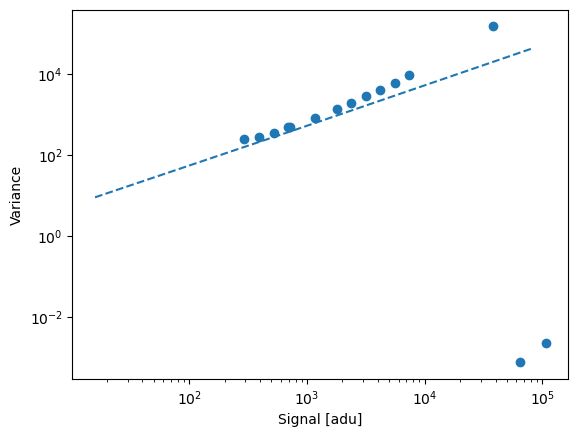

In [74]:
# Plot the reduced PTC
means = []
variances =[]

amp = 'C05'
for i, img in enumerate([struct.exposure for struct in isrRefs]):
    amp_obj           = camera[0].getAmplifiers()[0]
    # Clip 8 pix around the edges
    means.append(img.getImage().subset(amp_obj.getBBox().erodedBy(8)).getArray().mean())
    variances.append(img.getImage().subset(amp_obj.getBBox().erodedBy(8)).getArray().var())

plt.scatter(means, variances)
#plt.ylim(-5000,20000)
#plt.xlim(-5000,20000)
plt.plot(np.linspace(min(ptc_1.finalMeans[amp]),max(ptc.finalMeans[amp]),100), 1./ptc_1.gain[amp] * np.linspace(min(ptc_1.finalMeans[amp]),max(ptc_1.finalMeans[amp]),100), linestyle="--")
plt.loglog()
plt.ylabel("Variance")
plt.xlabel("Signal [adu]")

